## IMPORT ALL NECCESSORY LIBRARIES

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

READ THE DATASET

In [2]:
data=pd.read_csv('/content/Wholesale customers data.csv')
df=data.copy()

# DATA EXPLORATION

DISPLAY FIRST 5 ROWS OF THE DATASET

In [3]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


In [4]:
df.columns

Index(['Channel', 'Region', 'Fresh', 'Milk', 'Grocery', 'Frozen',
       'Detergents_Paper', 'Delicassen'],
      dtype='object')

SHAPE OF THE DATA

In [5]:
df.shape

(440, 8)

BASIC INFO ABOUT THE DATA

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Channel           440 non-null    int64
 1   Region            440 non-null    int64
 2   Fresh             440 non-null    int64
 3   Milk              440 non-null    int64
 4   Grocery           440 non-null    int64
 5   Frozen            440 non-null    int64
 6   Detergents_Paper  440 non-null    int64
 7   Delicassen        440 non-null    int64
dtypes: int64(8)
memory usage: 27.6 KB


There are total 8 columns , There is no missing values ,All the columns are  of datatype int.

In [7]:
df.isnull().sum()

,0
Channel,0
Region,0
Fresh,0
Milk,0
Grocery,0
Frozen,0
Detergents_Paper,0
Delicassen,0


STATISTICS OF THE NUMERICAL COLUMNS

In [8]:
df.describe()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,1.322727,2.543182,12000.297727,5796.265909,7951.277273,3071.931818,2881.493182,1524.870455
std,0.468052,0.774272,12647.328865,7380.377175,9503.162829,4854.673333,4767.854448,2820.105937
min,1.000000,1.000000,3.000000,55.000000,3.000000,25.000000,3.000000,3.000000
25%,1.000000,2.000000,3127.750000,1533.000000,2153.000000,742.250000,256.750000,408.250000
50%,1.000000,3.000000,8504.000000,3627.000000,4755.500000,1526.000000,816.500000,965.500000
75%,2.000000,3.000000,16933.750000,7190.250000,10655.750000,3554.250000,3922.000000,1820.250000
max,2.000000,3.000000,112151.000000,73498.000000,92780.000000,60869.000000,40827.000000,47943.000000


DROP DUPLICATES

In [9]:
df.drop_duplicates(inplace=True)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Channel           440 non-null    int64
 1   Region            440 non-null    int64
 2   Fresh             440 non-null    int64
 3   Milk              440 non-null    int64
 4   Grocery           440 non-null    int64
 5   Frozen            440 non-null    int64
 6   Detergents_Paper  440 non-null    int64
 7   Delicassen        440 non-null    int64
dtypes: int64(8)
memory usage: 27.6 KB


DISTRIBUTIONS

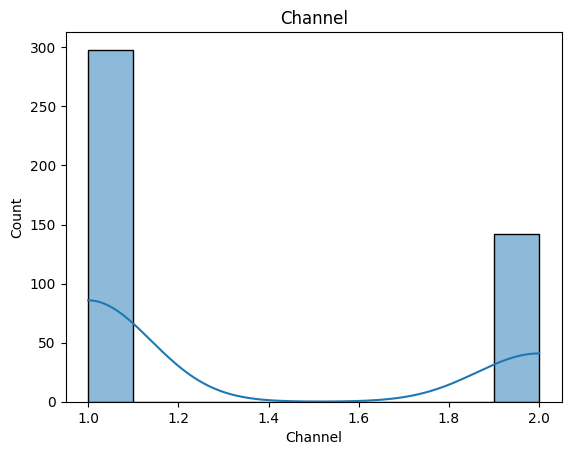

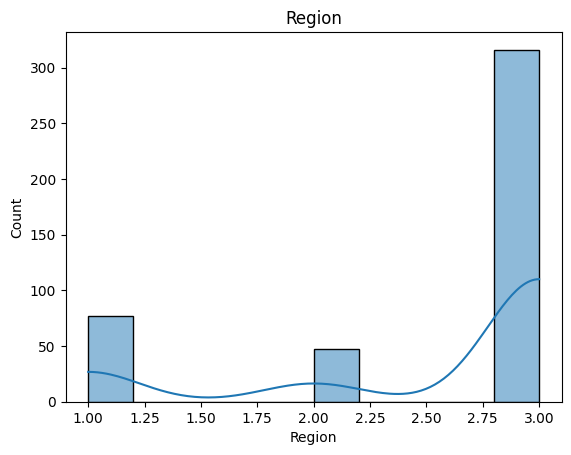

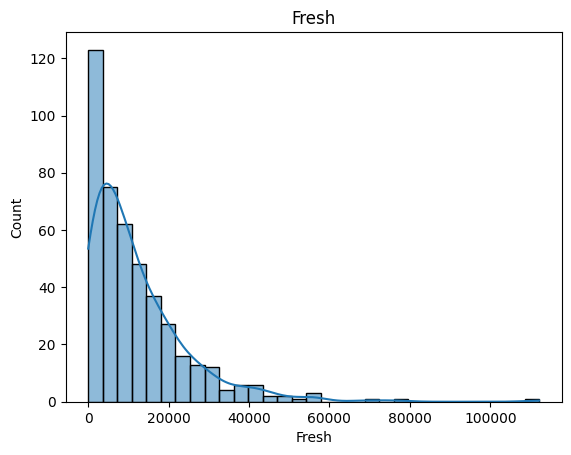

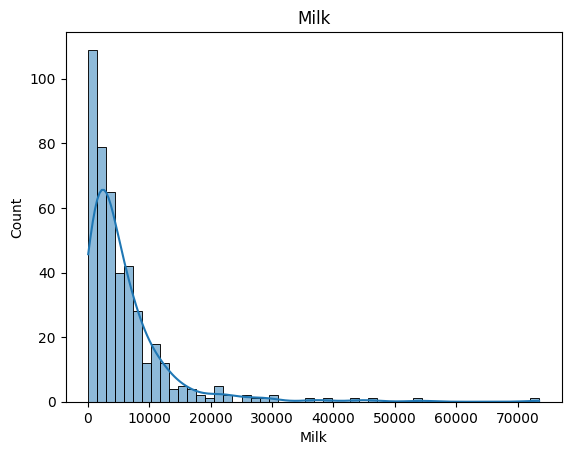

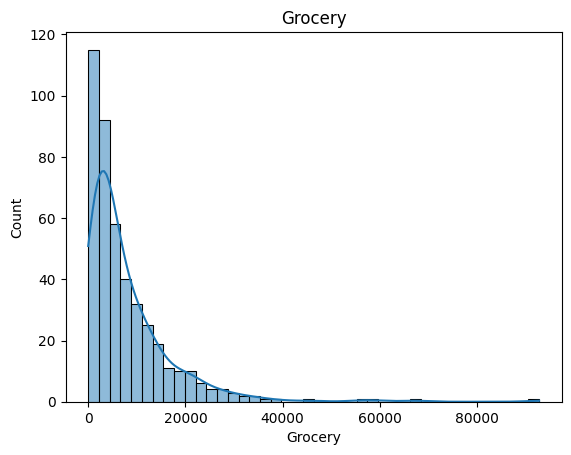

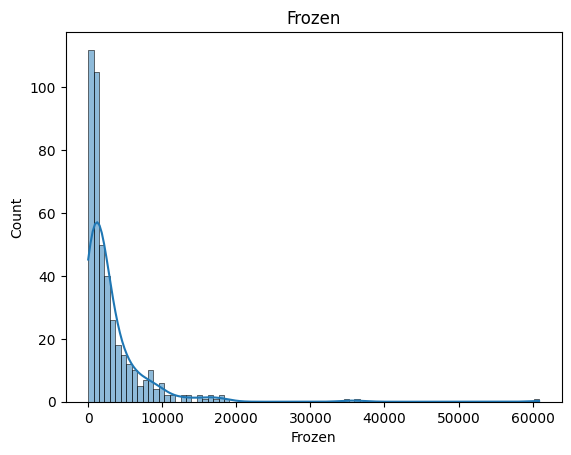

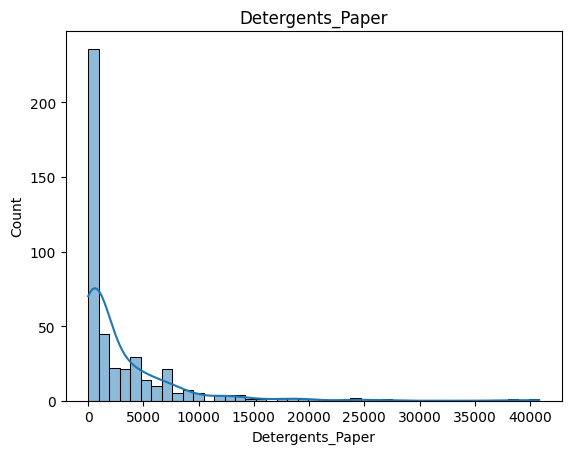

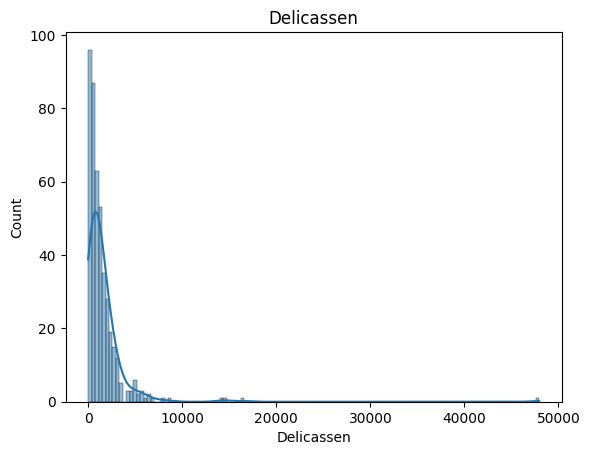

In [11]:
for col in df.columns:
  sns.histplot(df[col],kde=True)
  plt.title(col)
  plt.show()

'channel' and 'region' are discrete numerical features .They are categorical columns,eventhough they are of int type.
 Apply logtransormation to ll right skewed contineous numericl features .
This will give better clustering.

In [12]:
#convert channel and region to object type
df['Channel']=df['Channel'].astype('category')
df['Region']=df['Region'].astype('category')

In [13]:
df['Channel'].dtype

CategoricalDtype(categories=[1, 2], ordered=False, categories_dtype=int64)

In [14]:
cont_numericalcols=['Fresh', 'Milk', 'Grocery', 'Frozen',
       'Detergents_Paper', 'Delicassen']

In [15]:
#apply log transformation
for col in cont_numericalcols:
  df[col]=np.log(df[col])

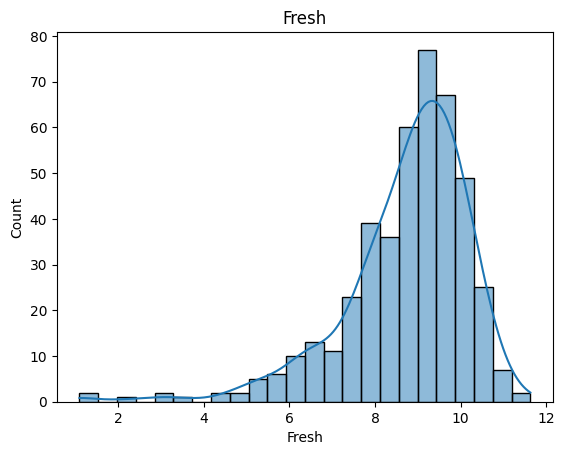

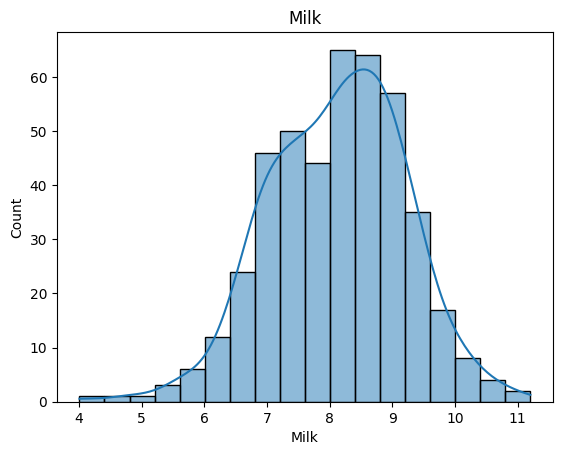

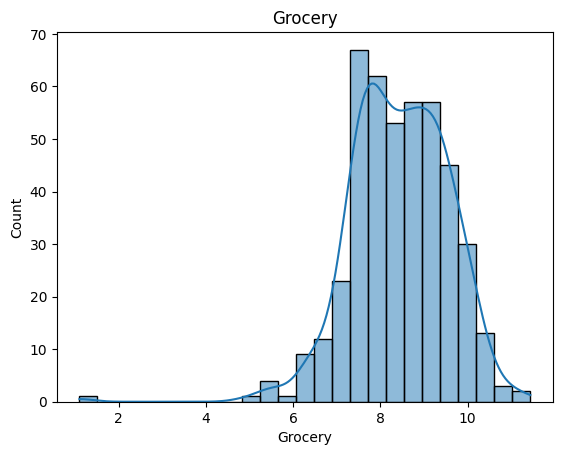

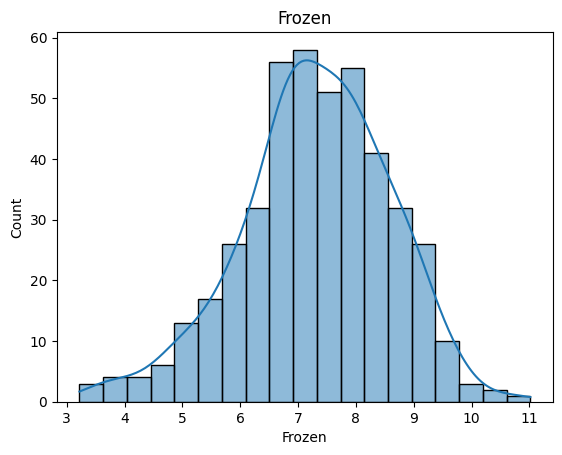

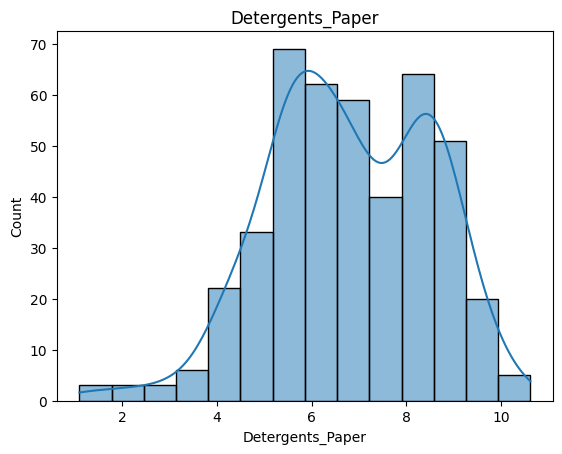

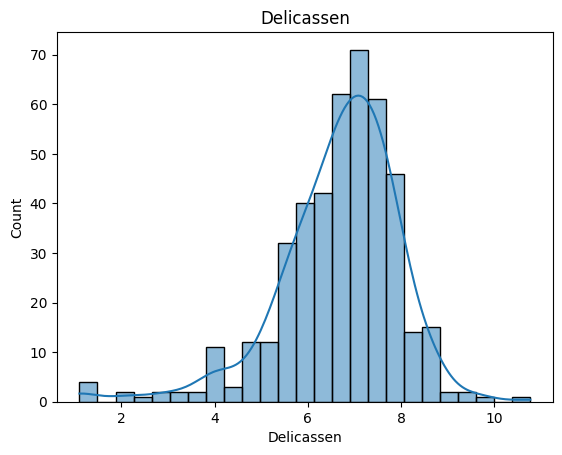

In [16]:
#distribution after applying logtransformation
for col in cont_numericalcols:
  sns.histplot(df[col],kde=True)
  plt.title(col)
  plt.show()

BOXPLOT___OUTLIER DETECTION

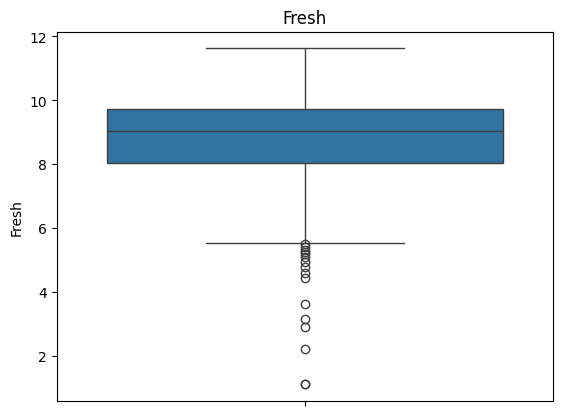

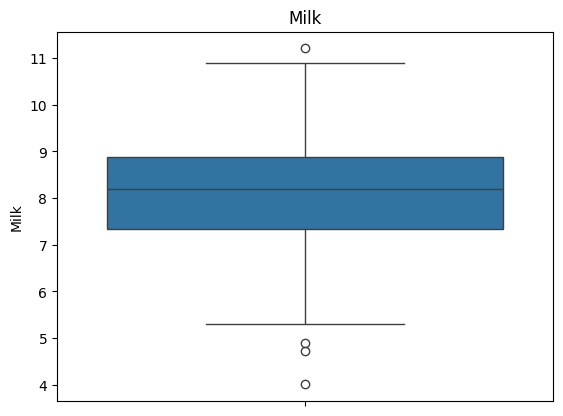

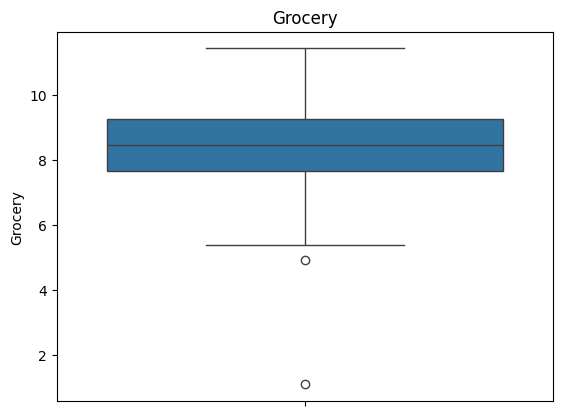

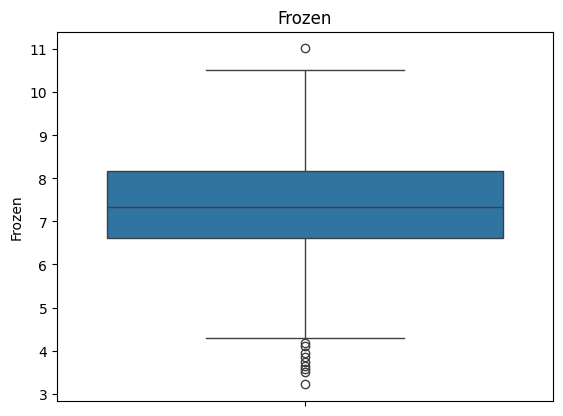

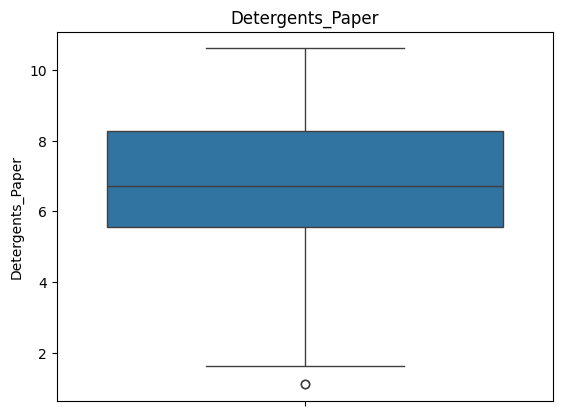

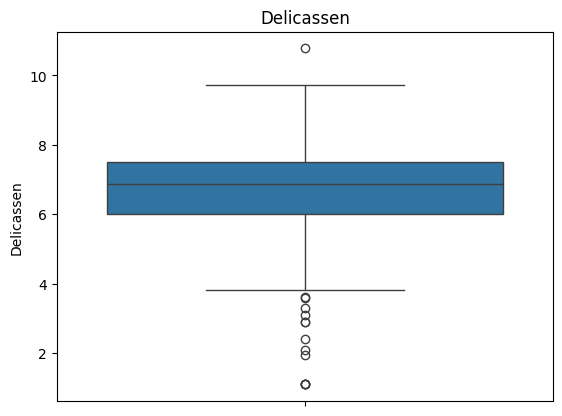

In [17]:
for col in cont_numericalcols:
  sns.boxplot(df[col])
  plt.title(col)
  plt.show()

ENCODING__ONE HOT ENCODE 'CHANNEL' AND 'REGION'

If you keep label-encoded categories, you're injecting fake distance — like saying Channel 2 is "twice" Channel 1, which isn’t valid.So first I converted 'channel' and 'region' into category columns then will apply Onehot encoding.

In [18]:
df_encoded=pd.get_dummies(df,columns=['Channel','Region'],dtype=int)

In [19]:
df_encoded.head()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,Channel_1,Channel_2,Region_1,Region_2,Region_3
0,9.446913,9.175335,8.930759,5.365976,7.891331,7.198931,0,1,0,0,1
1,8.861775,9.191158,9.166179,7.474205,8.099554,7.482119,0,1,0,0,1
2,8.756682,9.083416,8.946896,7.785305,8.165079,8.967504,0,1,0,0,1
3,9.492884,7.086738,8.347827,8.764678,6.228511,7.488853,1,0,0,0,1
4,10.026369,8.596004,8.881558,8.272571,7.482682,8.553525,0,1,0,0,1


# STANDARDISATION

In [20]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

All features (encoded or numeric) contribute equally to distance-based calculations.

It brings them to a common scale (like 0 to 1 or standardized with mean 0, std 1).

In [21]:
df_scaled=scaler.fit_transform(df_encoded)

In [22]:
type(df_scaled)

numpy.ndarray

In [23]:
#convert the scaled data back to type dataframe
df=pd.DataFrame(df_scaled,columns=df_encoded.columns)

In [24]:
df.head()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,Channel_1,Channel_2,Region_1,Region_2,Region_3
0,0.484561,0.976070,0.439132,-1.508418,0.643001,0.407685,-1.448652,1.448652,-0.460566,-0.345822,0.626422
1,0.088766,0.990718,0.650291,0.134683,0.764127,0.623967,-1.448652,1.448652,-0.460566,-0.345822,0.626422
2,0.017680,0.890970,0.453606,0.377147,0.802243,1.758420,-1.448652,1.448652,-0.460566,-0.345822,0.626422
3,0.515656,-0.957573,-0.083722,1.140446,-0.324282,0.629110,0.690297,-0.690297,-0.460566,-0.345822,0.626422
4,0.876512,0.439720,0.395003,0.756909,0.405285,1.442246,-1.448652,1.448652,-0.460566,-0.345822,0.626422


In [25]:
df.describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,Channel_1,Channel_2,Region_1,Region_2,Region_3
count,4.400000e+02,4.400000e+02,4.400000e+02,4.400000e+02,4.400000e+02,4.400000e+02,4.400000e+02,4.400000e+02,4.400000e+02,4.400000e+02,4.400000e+02
mean,-1.413011e-16,-4.521636e-16,-2.422305e-16,2.018587e-16,1.130409e-16,6.520037e-16,-1.614870e-17,1.614870e-17,-6.459479e-17,9.689219e-17,6.459479e-17
std,1.001138e+00,1.001138e+00,1.001138e+00,1.001138e+00,1.001138e+00,1.001138e+00,1.001138e+00,1.001138e+00,1.001138e+00,1.001138e+00,1.001138e+00
min,-5.162332e+00,-3.808515e+00,-6.585828e+00,-3.181814e+00,-3.308406e+00,-4.251391e+00,-1.448652e+00,-6.902971e-01,-4.605662e-01,-3.458220e-01,-1.596367e+00
25%,-4.616414e-01,-7.277472e-01,-6.875511e-01,-5.391077e-01,-7.200844e-01,-4.989215e-01,-1.448652e+00,-6.902971e-01,-4.605662e-01,-3.458220e-01,-1.596367e+00
50%,2.149246e-01,6.953960e-02,2.322023e-02,2.259570e-02,-4.709210e-02,1.584857e-01,6.902971e-01,-6.902971e-01,-4.605662e-01,-3.458220e-01,6.264224e-01
75%,6.808223e-01,7.030903e-01,7.468678e-01,6.815637e-01,8.658021e-01,6.427625e-01,6.902971e-01,1.448652e+00,-4.605662e-01,-3.458220e-01,6.264224e-01
max,1.959605e+00,2.855165e+00,2.687964e+00,2.895443e+00,2.228613e+00,3.140996e+00,6.902971e-01,1.448652e+00,2.171241e+00,2.891661e+00,6.264224e-01


After standardisation men is close to zero and std is close to 1.

# KMEANS CLUSTERING

In [26]:
from sklearn.cluster import KMeans
wcss=[]
for i in range (1,16):
  kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)#to avoid random intialisation trap kmeans++
  kmeans.fit(df)
  wcss.append(kmeans.inertia_)



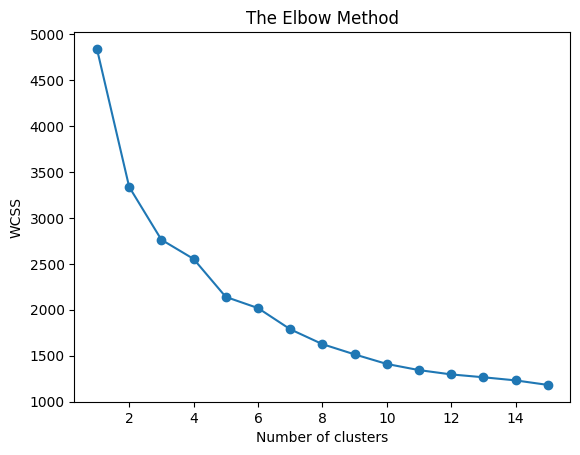

In [27]:

#plot ELBOW METHOD
plt.plot(range(1,16),wcss,marker='o')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [29]:
#best k value is elbow value k=3
kmeans=KMeans(n_clusters=3,init='k-means++',random_state=42)
y_kmeans=kmeans.fit_predict(df)

In [30]:

y_kmeans

array([0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2,
       2, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 2, 2, 2, 0, 0,
       0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0,
       2, 0, 2, 2, 2, 2, 2, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 2,
       2, 2, 2, 2, 0, 2, 0, 2, 0, 2, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0,
       2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 2, 0,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 1, 0,
       1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 0, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 0, 1, 0, 1, 0, 0, 1, 0,

In [31]:
#to check the quality of clustering
from sklearn.metrics import silhouette_score
sil_kmeans=silhouette_score(df,y_kmeans)
sil_kmeans

np.float64(0.32369028281640444)

Scatter plots of kmeans clusters

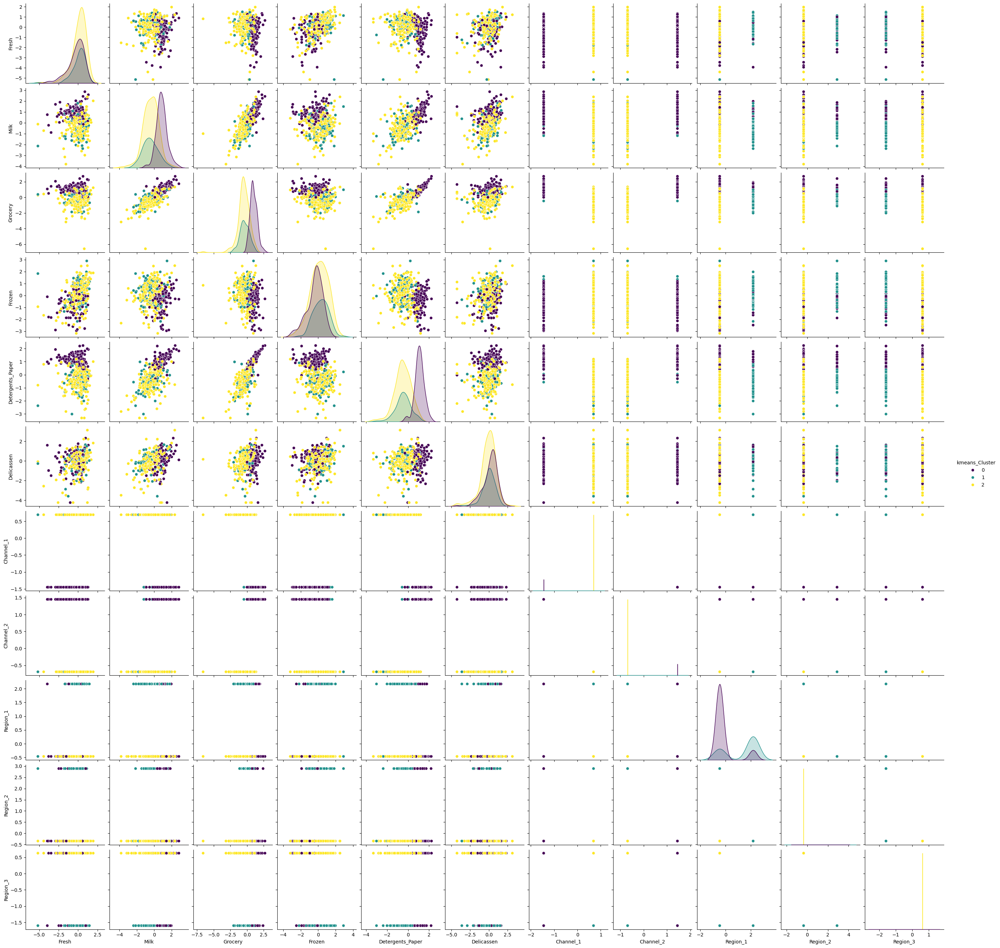

In [32]:
df_viz = df.copy()
df_viz['kmeans_Cluster'] = y_kmeans

sns.pairplot(df_viz, hue='kmeans_Cluster',palette='viridis', diag_kind='kde')


Try kmeans with k=5

FOR K MEANS CLUSTERING BEST CLUSTERING IS OBTAINED WHEN NO OF CLUSTERS IS EQUAL TO 3

# Aglomerative hierachial clustering

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.11/dist-packages/matplotlib/pyplot.py'>

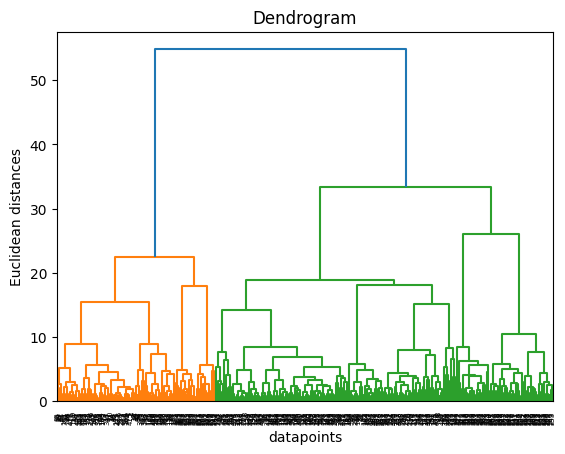

In [36]:
import scipy.cluster.hierarchy as sch
dg=sch.dendrogram(sch.linkage(df,method='ward'))
plt.title('Dendrogram')
plt.xlabel('datapoints')
plt.ylabel('Euclidean distances')
plt

The longest line intercept at two points when a horizontal line is drawn over it.so choose no of clusters as 2

In [37]:

from sklearn.cluster import AgglomerativeClustering
ahc=AgglomerativeClustering(n_clusters=2,metric='euclidean',linkage='ward')
y_ahc=ahc.fit_predict(df)

In [ ]:
y_ahc

array([1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0,
       0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1,

In [38]:
#to check the quality of clustering
from sklearn.metrics import silhouette_score
sil_ahc=silhouette_score(df,y_ahc)
sil_ahc

np.float64(0.32828815406162776)

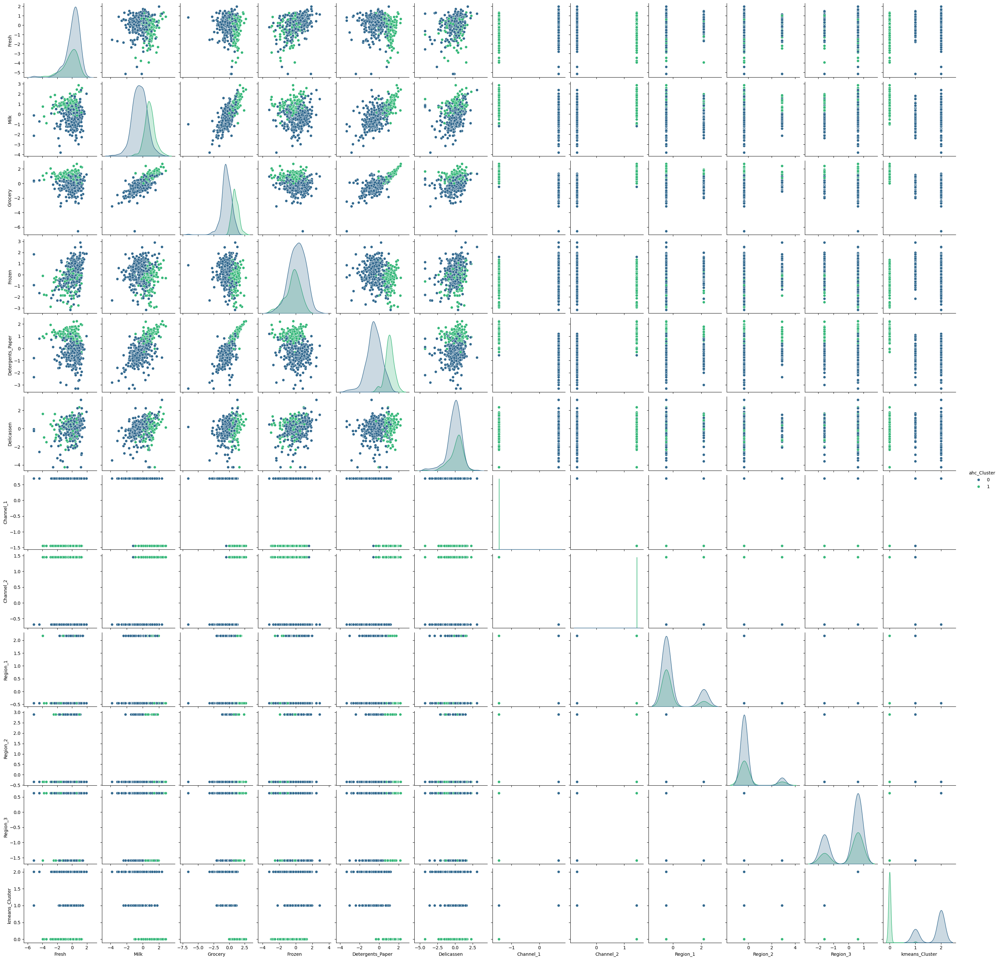

In [39]:
df_viz['ahc_Cluster'] = y_ahc

sns.pairplot(df_viz, hue='ahc_Cluster',palette='viridis', diag_kind='kde')


# DBSCAN

In [40]:

from sklearn.cluster import DBSCAN
dbscan=DBSCAN(eps=3,min_samples=6)
y_dbscan=dbscan.fit_predict(df)

In [ ]:

# from sklearn.cluster import DBSCAN
# dbscan=DBSCAN(eps=2,min_samples=4)
# y_dbscan=dbscan.fit_predict(df)

In [41]:

y_dbscan

array([ 0,  0,  0,  1,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  1,  0,
        1,  0,  1,  0,  1,  1,  0,  0,  0,  1,  1,  0,  1,  1,  1,  1,  1,
        1,  0,  1,  0,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  1,
        1,  0,  0,  1,  1,  0,  0,  1,  1,  0,  0,  0,  0,  1,  0,  1,  0,
        1,  1,  1,  1,  1,  0,  0, -1,  1,  0,  1,  1,  1,  0,  0,  1,  0,
        0,  0,  1,  1,  1,  1,  1,  0,  1,  0, -1,  0,  1,  1,  1,  0,  0,
        0,  1,  1,  1,  0,  0,  0,  0,  1,  0,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  0,  1,  1,  1,  0,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  0,  1,  1,  1,  1,  1,  1,  1,
        1, -1,  0,  0,  1,  0,  0,  0,  1,  1,  0,  0,  0,  0,  1,  1,  1,
        0,  0,  1,  0,  1,  0,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  0,  0,  1,  1,  1,  0,  1,  1,  2,  3,  2,  2,  3,  3,  2,  2,
        2,  3,  2,  3,  2,  3,  2,  3,  2,  2,  3,  2,  3,  2,  3,  2,  2,
        2,  2,  3,  2,  2

In [42]:

#to check the quality of clustering
from sklearn.metrics import silhouette_score
sil_dbsc=silhouette_score(df,y_dbscan)
sil_dbsc

np.float64(0.38353749042955343)

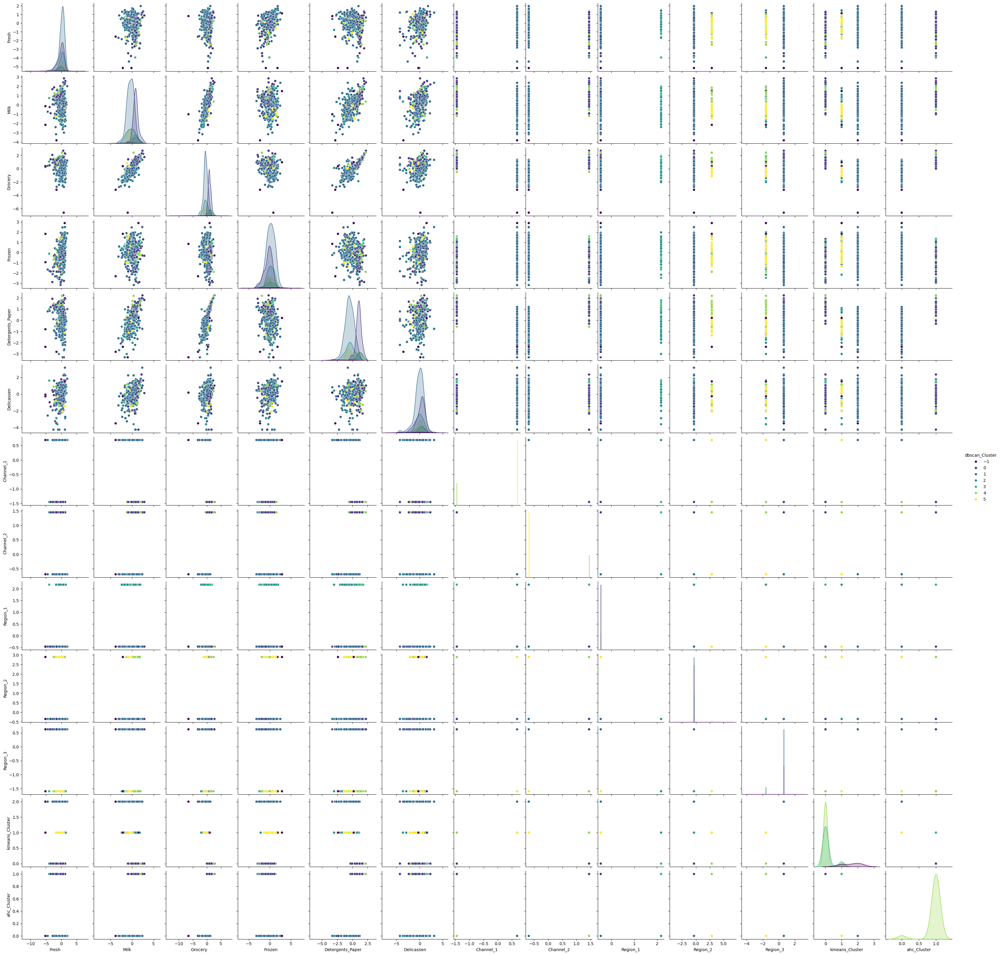

In [43]:

df_viz['dbscan_Cluster'] = y_dbscan

sns.pairplot(df_viz, hue='dbscan_Cluster',palette='viridis', diag_kind='kde')


In [44]:
from collections import Counter

labels = y_dbscan
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)
cluster_sizes = Counter(labels)

print(f"Estimated number of clusters: {n_clusters}")
print(f"Estimated number of noise points: {n_noise}")
print("Cluster sizes:", cluster_sizes)


Estimated number of clusters: 6
Estimated number of noise points: 5
Cluster sizes: Counter({np.int64(1): 208, np.int64(0): 105, np.int64(2): 59, np.int64(5): 26, np.int64(4): 19, np.int64(3): 18, np.int64(-1): 5})


I will choose epsilon as 3 and min_sample as 6 for dbscan . which gave better sillhoute score and less no of noise points.

# PCA

In [76]:
from sklearn.decomposition import PCA
pca=PCA(n_components=3)
x_pca=pca.fit_transform(df)


In [77]:
pca.explained_variance_ratio_#varianceexplained by each component

array([0.3657347 , 0.16994981, 0.14907075])

In [78]:
x_pca

array([[-2.40685787,  0.9625819 , -0.04006015],
       [-2.39631788,  0.64870848,  0.73458531],
       [-2.39861056,  0.48767683,  1.4053589 ],
       ...,
       [-3.50890344,  0.69232767,  0.62127658],
       [ 1.41130956,  0.83684232,  0.58115857],
       [ 1.10518858,  1.6047996 , -2.61125355]])

In [79]:
type(x_pca)

numpy.ndarray

In [80]:
#convert to df
df_pca=pd.DataFrame(data=x_pca,columns=['pc1','pc2','pc3'])

In [81]:
df_pca.head(1)

,pc1,pc2,pc3
0,-2.406858,0.962582,-0.04006


In [82]:
#kmeans clustering on pca result
from sklearn.cluster import KMeans
wcss=[]
for i in range (1,16):
  kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
  kmeans.fit(df_pca)
  wcss.append(kmeans.inertia_)



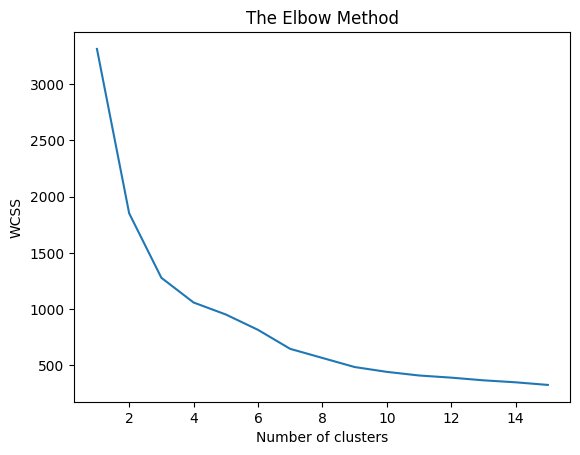

In [83]:
#plot ELBOW METHOD
plt.plot(range(1,16),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [109]:

#best k value  k=3
kmeans=KMeans(n_clusters=3,init='k-means++',random_state=42)
y_pca=kmeans.fit_predict(df_pca)

In [110]:
from sklearn.metrics import silhouette_score
sil_pca=silhouette_score(df_pca,y_pca)
sil_pca

np.float64(0.5162954682452077)

After doing pca sillhoute score improved fro kmeans clustering.

In [97]:
#agglomerative hierarchial for pca data
from sklearn.cluster import AgglomerativeClustering
ahc=AgglomerativeClustering(n_clusters=4,metric='euclidean',linkage='ward')
y_ahc_pca=ahc.fit_predict(df_pca)

In [98]:
#to check the quality of clustering
from sklearn.metrics import silhouette_score
sil_ahc=silhouette_score(df_pca,y_ahc_pca)
sil_ahc

np.float64(0.5760388190081338)

After doing pca and applying ahc sillhoute score improved

In [94]:
#dbscan on pca data
from sklearn.cluster import DBSCAN
dbscan=DBSCAN(eps=1.5,min_samples=4)
y_dbscan_pca=dbscan.fit_predict(df_pca)


In [95]:
sil_dbsc_pca=silhouette_score(df_pca,y_dbscan_pca)
sil_dbsc_pca

np.float64(0.5329149430403828)

In [100]:
#dbscan on pca data with eps=1
from sklearn.cluster import DBSCAN
dbscan=DBSCAN(eps=1,min_samples=4)
y_dbscan_pca=dbscan.fit_predict(df_pca)


In [101]:
sil_dbsc_pca=silhouette_score(df_pca,y_dbscan_pca)
sil_dbsc_pca

np.float64(0.595267565520001)

for eps=1 and min_sample=4 better sillhoute score ,less noise points and good clustering.

With eps=1and min_sample=4 sillhoute score improved.

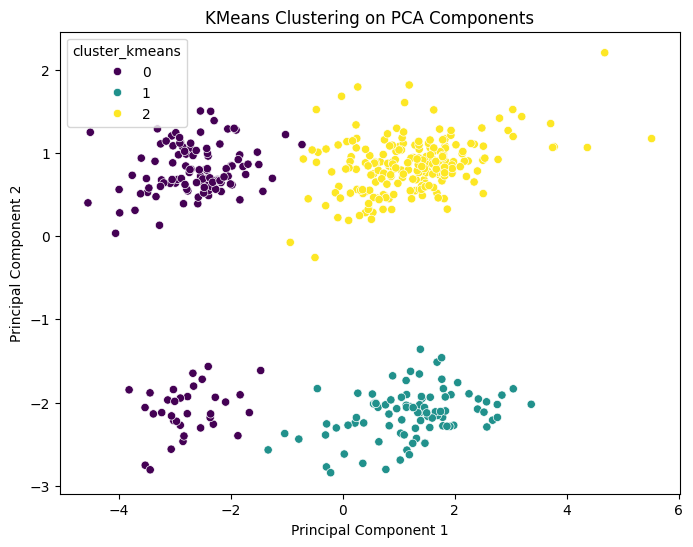

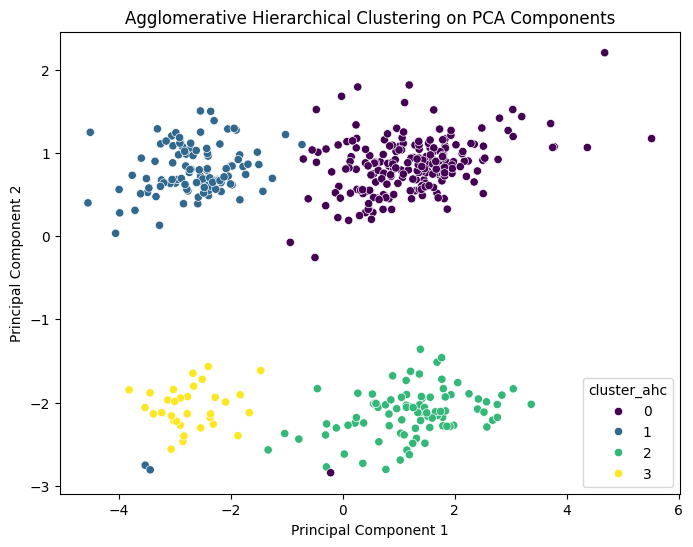

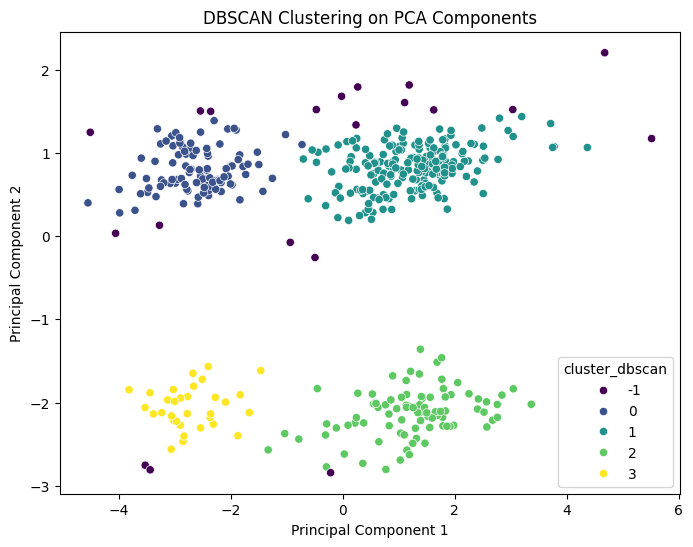

In [102]:
# Add the predicted cluster labels to the PCA dataframe
df_pca['cluster_kmeans'] = y_pca
df_pca['cluster_ahc'] = y_ahc_pca
df_pca['cluster_dbscan'] = y_dbscan_pca

# Visualize KMeans clusters on PCA components
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_pca, x='pc1', y='pc2', hue='cluster_kmeans', palette='viridis', legend='full')
plt.title('KMeans Clustering on PCA Components')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# Visualize Agglomerative Hierarchical clusters on PCA components
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_pca, x='pc1', y='pc2', hue='cluster_ahc', palette='viridis', legend='full')
plt.title('Agglomerative Hierarchical Clustering on PCA Components')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# Visualize DBSCAN clusters on PCA components
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_pca, x='pc1', y='pc2', hue='cluster_dbscan', palette='viridis', legend='full')
plt.title('DBSCAN Clustering on PCA Components')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

Better clustering is obtained for all the models after PCA.

# CLUSTERING WITHOUT APPLYING LOG TRANSFORMATION TO SKEWED DATA

In [ ]:
df1=data.copy()

STANDARDISE CONTINEOUS NUMERICAL COLUMN

In [ ]:
cont_numericalcols

['Fresh', 'Milk', 'Grocery', 'Frozen', 'Detergents_Paper', 'Delicassen']

In [ ]:
x1=df1[cont_numericalcols]

In [ ]:
x1=scaler.fit_transform(x1)

In [ ]:
x1=pd.DataFrame(x1,columns=cont_numericalcols)

In [ ]:
x1.head()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,0.052933,0.523568,-0.041115,-0.589367,-0.043569,-0.066339
1,-0.391302,0.544458,0.170318,-0.270136,0.086407,0.089151
2,-0.447029,0.408538,-0.028157,-0.137536,0.133232,2.243293
3,0.100111,-0.624020,-0.392977,0.687144,-0.498588,0.093411
4,0.840239,-0.052396,-0.079356,0.173859,-0.231918,1.299347


In [ ]:
df1=df1.drop(cont_numericalcols,axis=1)

In [ ]:
#concatenate
df1 = pd.concat([df1, x1], axis=1)
df1.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,0.052933,0.523568,-0.041115,-0.589367,-0.043569,-0.066339
1,2,3,-0.391302,0.544458,0.170318,-0.270136,0.086407,0.089151
2,2,3,-0.447029,0.408538,-0.028157,-0.137536,0.133232,2.243293
3,1,3,0.100111,-0.624020,-0.392977,0.687144,-0.498588,0.093411
4,2,3,0.840239,-0.052396,-0.079356,0.173859,-0.231918,1.299347


# KMEANS

In [ ]:
from sklearn.cluster import KMeans
wcss=[]
for i in range (1,16):
  kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)#to avoid random intialisation trap kmeans++
  kmeans.fit(df1)
  wcss.append(kmeans.inertia_)



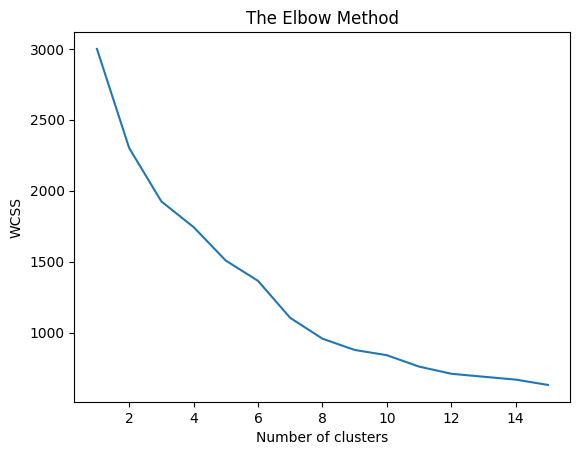

In [ ]:

#plot ELBOW METHOD
plt.plot(range(1,16),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
#best k value is elbow value k=3
kmeans=KMeans(n_clusters=5,init='k-means++',random_state=42)
y_kmeans=kmeans.fit_predict(df1)

In [ ]:
from sklearn.metrics import silhouette_score
sil_kmeans=silhouette_score(df1,y_kmeans)
sil_kmeans

np.float64(0.2648046055045756)

Agglomerative hierarchial clustering

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.11/dist-packages/matplotlib/pyplot.py'>

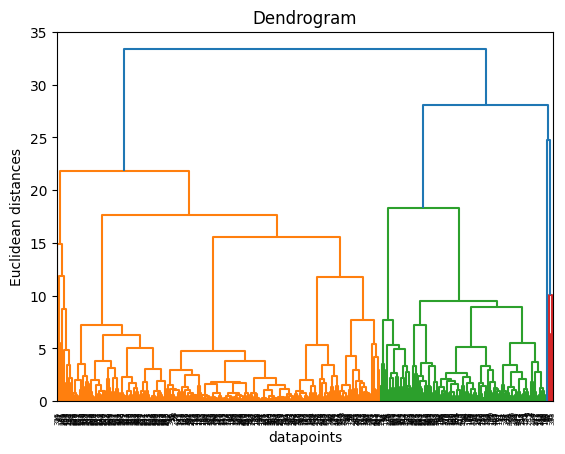

In [ ]:
import scipy.cluster.hierarchy as sch
dg=sch.dendrogram(sch.linkage(df1,method='ward'))
plt.title('Dendrogram')
plt.xlabel('datapoints')
plt.ylabel('Euclidean distances')
plt

In [ ]:

from sklearn.cluster import AgglomerativeClustering
ahc=AgglomerativeClustering(n_clusters=2,metric='euclidean',linkage='ward')
y_ahc=ahc.fit_predict(df1)

In [ ]:
sil_ahc=silhouette_score(df1,y_ahc)
sil_ahc

np.float64(0.26747895253704795)

# DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN
dbscan=DBSCAN(eps=1.5,min_samples=4)
y_dbscan=dbscan.fit_predict(df1)

In [ ]:
sil_dbscan=silhouette_score(df1,y_dbscan)
sil_dbscan

np.float64(0.5588501624083738)

In [ ]:
from sklearn.cluster import DBSCAN
dbscan=DBSCAN(eps=3,min_samples=2)
y_dbscan=dbscan.fit_predict(df1)

In [ ]:
sil_dbscan=silhouette_score(df1,y_dbscan)
sil_dbscan

np.float64(0.5213518284561216)

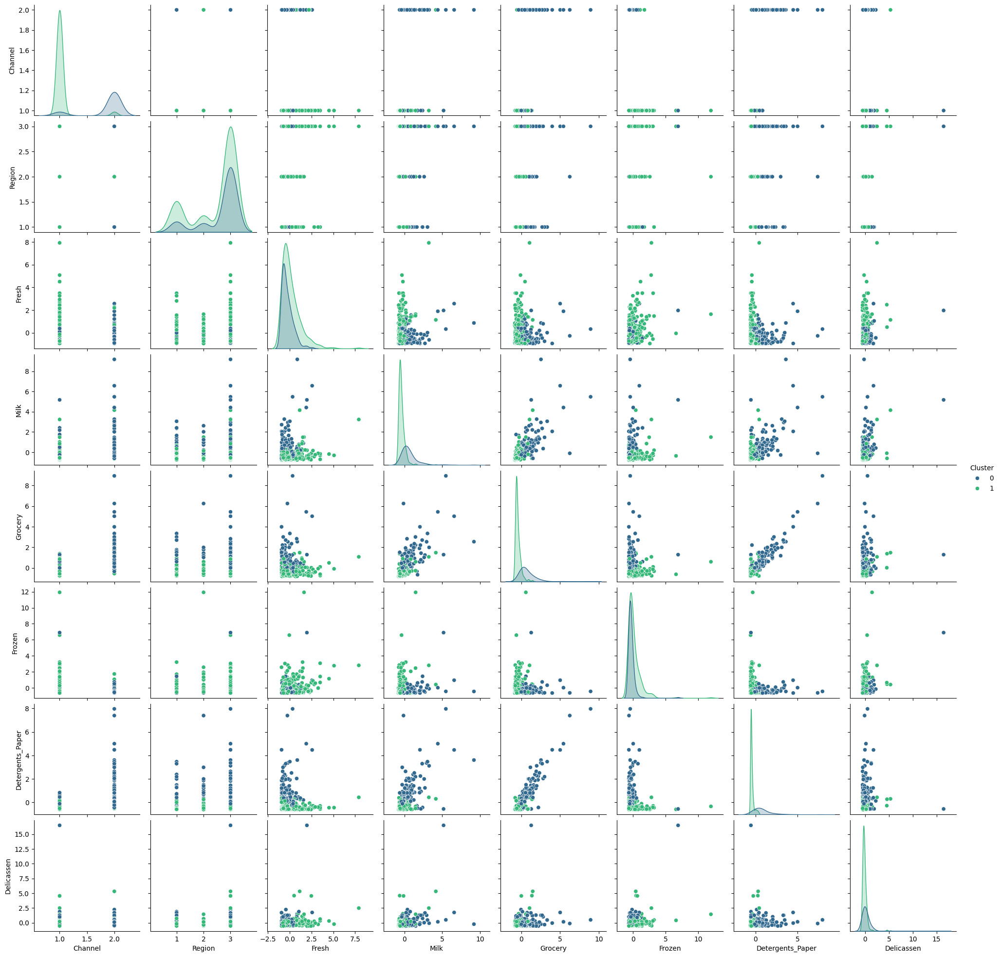

In [ ]:
df_viz = df1.copy()
df_viz['Cluster'] = y_ahc

sns.pairplot(df_viz, hue='Cluster',palette='viridis', diag_kind='kde')


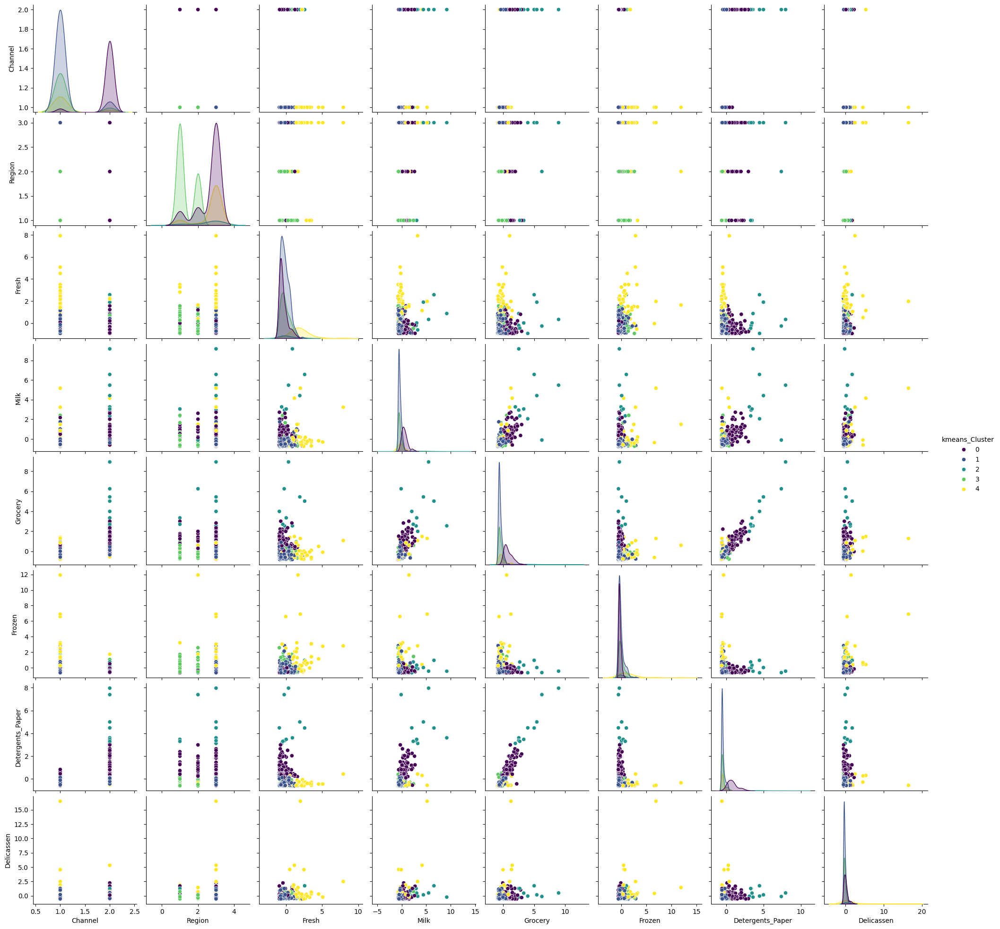

In [ ]:

df_viz = df1.copy()
df_viz['kmeans_Cluster'] = y_kmeans

sns.pairplot(df_viz, hue='kmeans_Cluster',palette='viridis', diag_kind='kde')


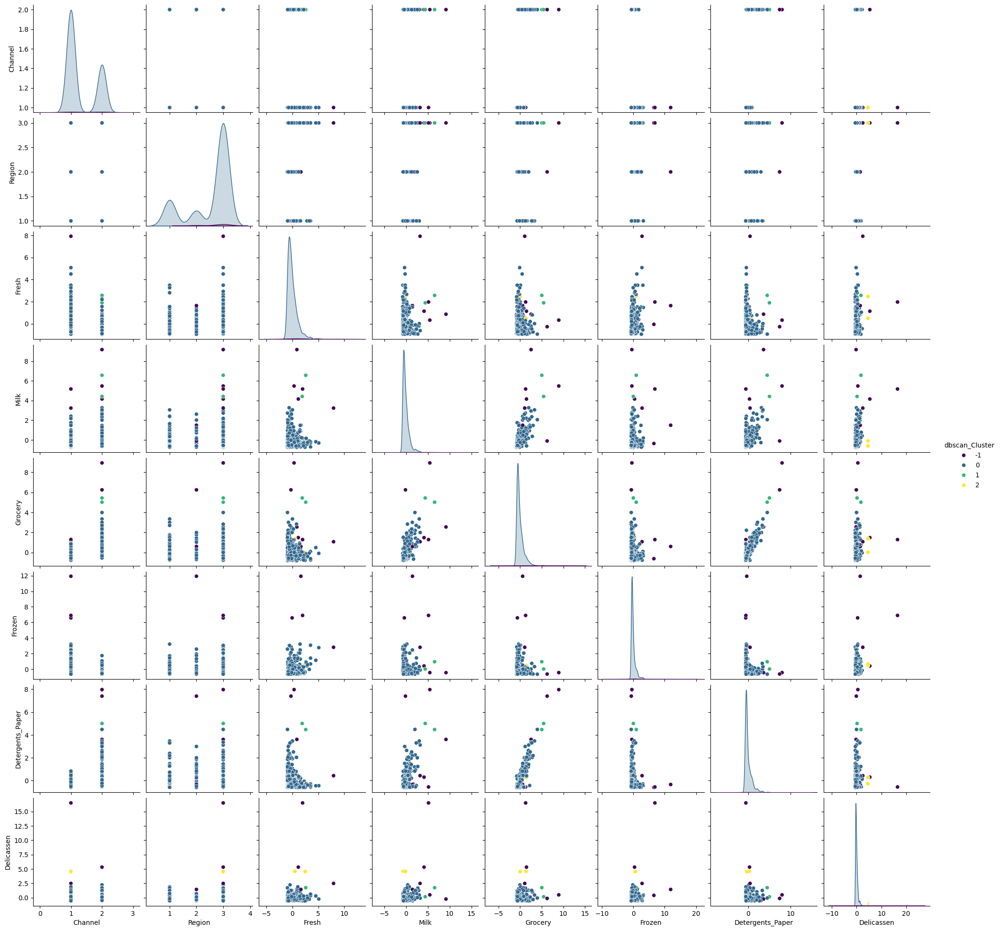

In [ ]:

df_viz = df1.copy()
df_viz['dbscan_Cluster'] = y_dbscan

sns.pairplot(df_viz, hue='dbscan_Cluster',palette='viridis', diag_kind='kde')


#  Clustering  works well with log transformed data.

*********************************************************************************************

# To study purchasing patterns from contineous numerical column only (drop 'channel' and 'region' columns)


In [113]:
#take log transformed contineous numerical columns only
df=data.copy()
df[cont_numericalcols].head()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,12669,9656,7561,214,2674,1338
1,7057,9810,9568,1762,3293,1776
2,6353,8808,7684,2405,3516,7844
3,13265,1196,4221,6404,507,1788
4,22615,5410,7198,3915,1777,5185


In [114]:
#apply log transformation
for col in cont_numericalcols:
  df[col]=np.log(df[col])

In [115]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,9.446913,9.175335,8.930759,5.365976,7.891331,7.198931
1,2,3,8.861775,9.191158,9.166179,7.474205,8.099554,7.482119
2,2,3,8.756682,9.083416,8.946896,7.785305,8.165079,8.967504
3,1,3,9.492884,7.086738,8.347827,8.764678,6.228511,7.488853
4,2,3,10.026369,8.596004,8.881558,8.272571,7.482682,8.553525


In [116]:
df[cont_numericalcols].describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,8.730544,8.121047,8.441169,7.301396,6.785972,6.665133
std,1.480071,1.081365,1.116172,1.284540,1.721020,1.310832
min,1.098612,4.007333,1.098612,3.218876,1.098612,1.098612
25%,8.048059,7.334981,7.674616,6.609678,5.548101,6.011875
50%,9.048286,8.196159,8.467057,7.330388,6.705018,6.872645
75%,9.737064,8.880480,9.273854,8.175896,8.274341,7.506728
max,11.627601,11.205013,11.437986,11.016479,10.617099,10.777768


# Scale

Clustering algorithms like KMeans, DBSCAN, and even PCA are distance-based, and they assume all features contribute equally. If one feature has a wider range or higher variance, it dominates the clustering result.

In [119]:
df_scaled=scaler.fit_transform(df[cont_numericalcols])

In [120]:
df_scaled=pd.DataFrame(df_scaled,columns=cont_numericalcols)

In [121]:
#data without scaling
df2=df[cont_numericalcols]

KMEANS

In [122]:
from sklearn.cluster import KMeans
wcss=[]
for i in range (1,16):
  kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)#to avoid random intialisation trap kmeans++
  kmeans.fit(df_scaled)
  #kmeans.fit(df2)
  wcss.append(kmeans.inertia_)



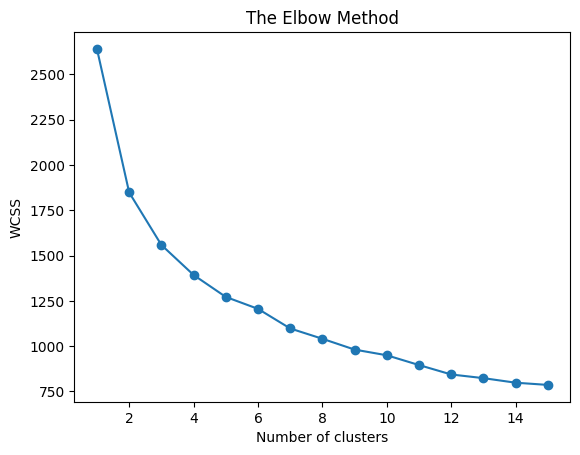

In [123]:
#plot ELBOW METHOD
plt.plot(range(1,16),wcss,marker='o')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [141]:
#best k value is elbow value k=5
kmeans=KMeans(n_clusters=3,init='k-means++',random_state=42)
y_kmeans=kmeans.fit_predict(df_scaled)
#y_kmeans=kmeans.fit_predict(df2)

In [142]:
#to check the quality of clustering
from sklearn.metrics import silhouette_score
sil_kmeans=silhouette_score(df_scaled,y_kmeans)
#sil_kmeans=silhouette_score(df2,y_kmeans)
sil_kmeans

np.float64(0.2598656574391975)

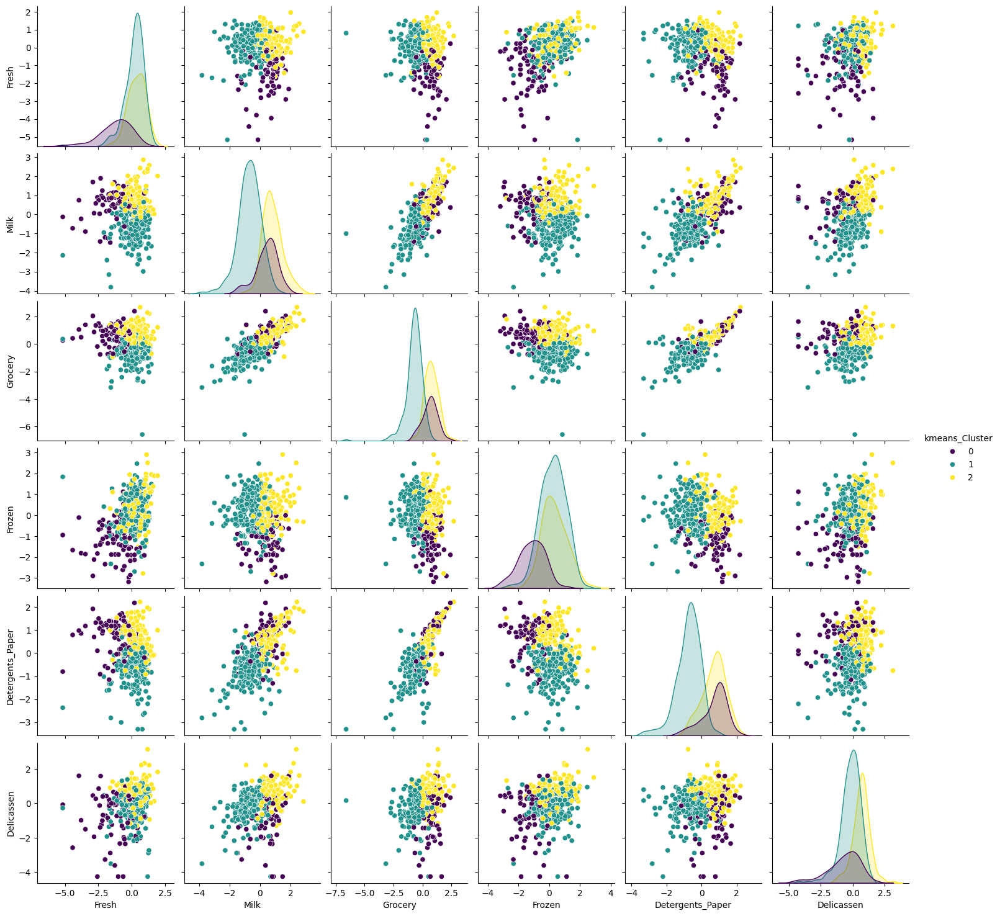

In [143]:
df_viz = df_scaled.copy()
#df_viz = df2.copy()
df_viz['kmeans_Cluster'] = y_kmeans

sns.pairplot(df_viz, hue='kmeans_Cluster',palette='viridis', diag_kind='kde')


AHC

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.11/dist-packages/matplotlib/pyplot.py'>

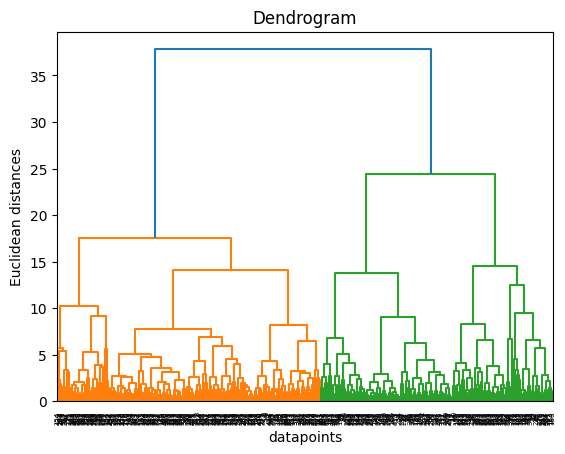

In [144]:
import scipy.cluster.hierarchy as sch
dg=sch.dendrogram(sch.linkage(df_scaled,method='ward'))
#dg=sch.dendrogram(sch.linkage(df2,method='ward'))
plt.title('Dendrogram')
plt.xlabel('datapoints')
plt.ylabel('Euclidean distances')
plt

In [145]:
from sklearn.cluster import AgglomerativeClustering
ahc=AgglomerativeClustering(n_clusters=2,metric='euclidean',linkage='ward')
y_ahc=ahc.fit_predict(df_scaled)
#y_ahc=ahc.fit_predict(df2)

In [146]:
#to check the quality of clustering
sil_ahc=silhouette_score(df_scaled,y_ahc)
#sil_ahc=silhouette_score(df2,y_ahc)
sil_ahc

np.float64(0.2629249016127347)

In [149]:
from sklearn.cluster import AgglomerativeClustering
ahc=AgglomerativeClustering(n_clusters=3,metric='euclidean',linkage='ward')
y_ahc=ahc.fit_predict(df_scaled)
#y_ahc=ahc.fit_predict(df2)

In [150]:
#to check the quality of clustering
sil_ahc=silhouette_score(df_scaled,y_ahc)
#sil_ahc=silhouette_score(df2,y_ahc)
sil_ahc

np.float64(0.2349989044190331)

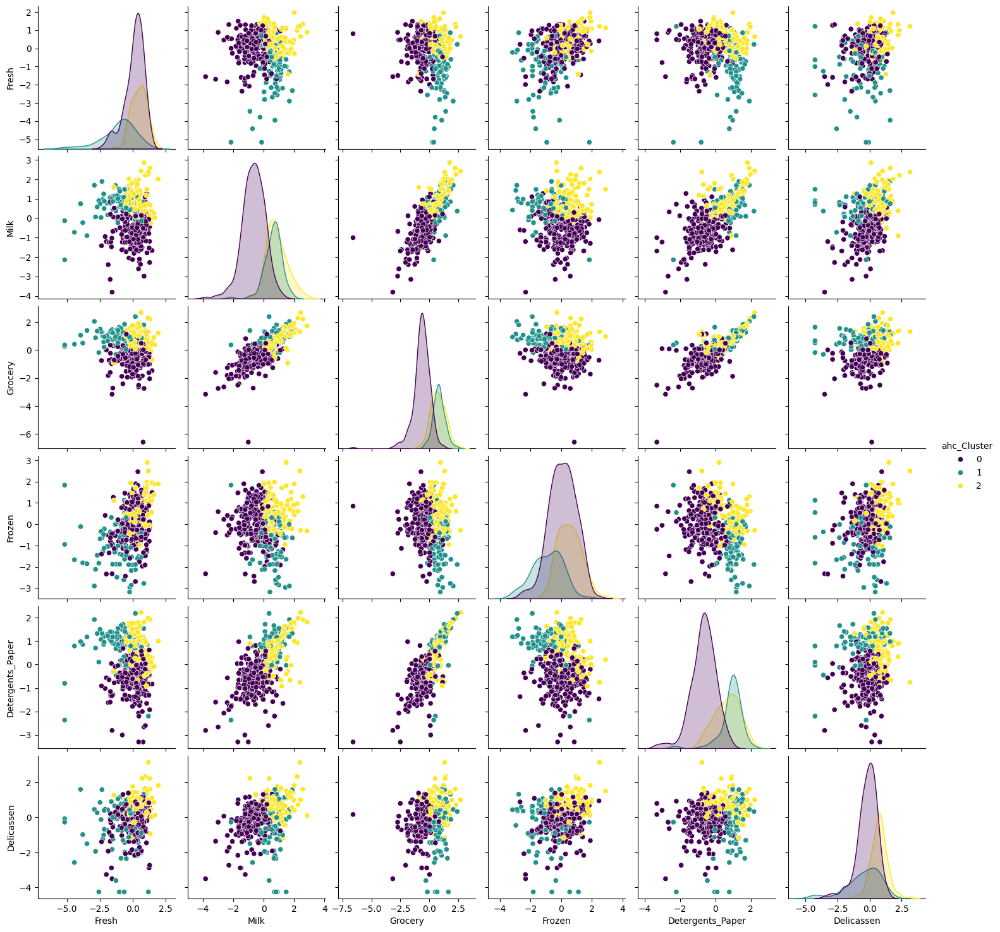

In [151]:
df_viz = df_scaled.copy()
#df_viz = df2.copy()
df_viz['ahc_Cluster'] = y_ahc

sns.pairplot(df_viz, hue='ahc_Cluster',palette='viridis', diag_kind='kde')


DBSCAN

In [152]:
from sklearn.cluster import DBSCAN
dbscan=DBSCAN(eps=1.5,min_samples=3)
y_dbscan=dbscan.fit_predict(df_scaled)
#y_dbscan=dbscan.fit_predict(df2)

In [153]:
#to check the quality of clustering
sil_db=silhouette_score(df_scaled,y_dbscan)
#sil_db=silhouette_score(df2,y_dbscan)
sil_db

np.float64(0.3028187768022053)

SCATTER PLOT OF DBSCAN

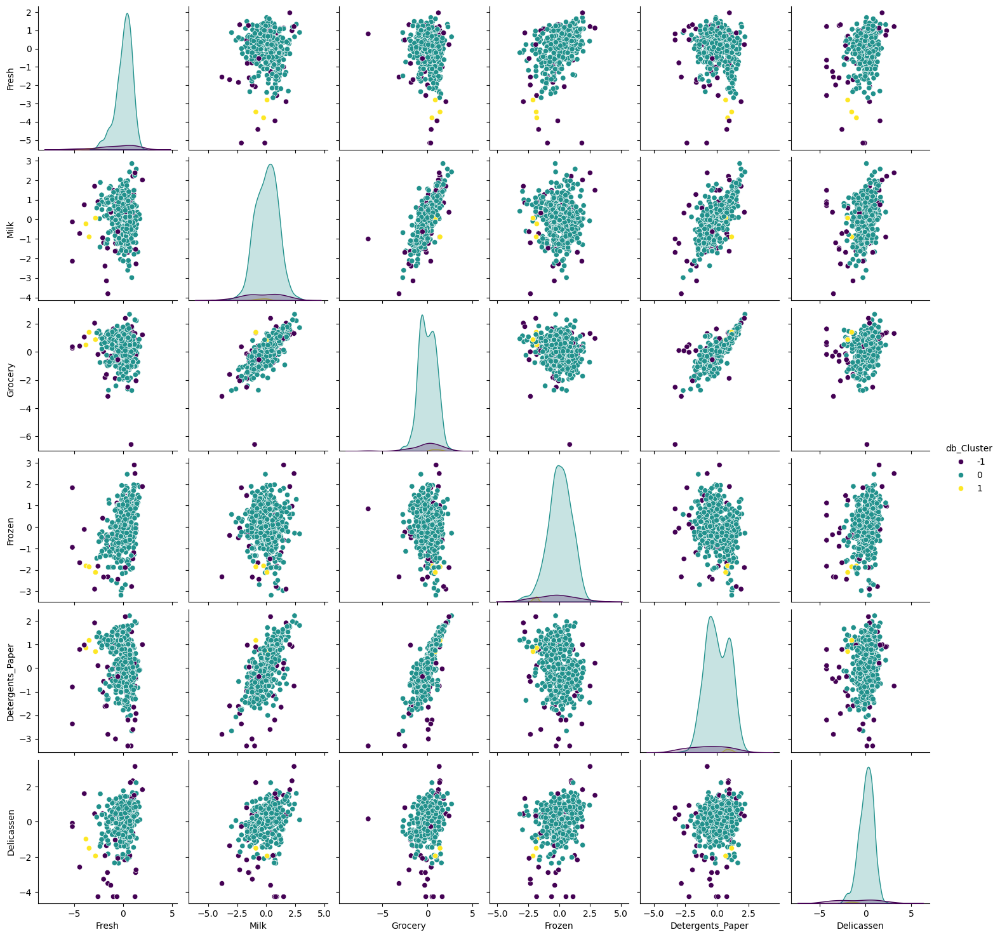

In [154]:

df_viz['db_Cluster'] = y_dbscan

sns.pairplot(df_viz, hue='db_Cluster',palette='viridis', diag_kind='kde')


In this case better clustering is obtained with kmeans and AHC.